In [18]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import gridspec
from PIL import Image

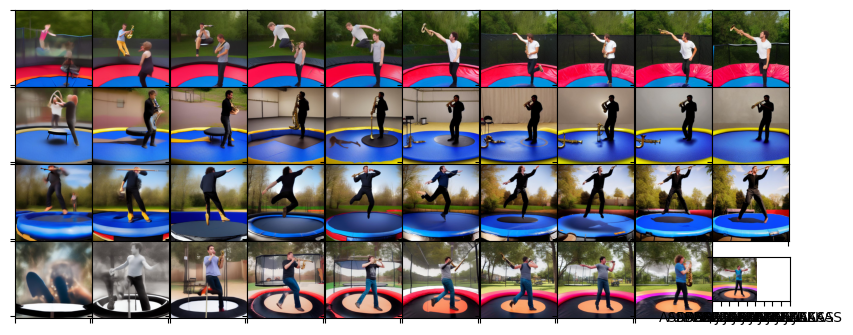

In [40]:
nrow = 4
ncol = 10

fig = plt.figure(figsize=(10, 4)) 

gs = gridspec.GridSpec(nrow, ncol, width_ratios=np.ones(ncol),
         wspace=0.0, hspace=0.0)

scales = [0.7,0.49,0.39,0.32,0.27,0.23,0.2,0.18,0.16,0.148]
for i in range(nrow):
    for j in range(ncol):
        im = Image.open(f"ours/{scales[j]}/outputs/txt_0000{i}.jpeg")
        ax= plt.subplot(gs[i,j])
        ax.imshow(im)
        ax.set_xticklabels([])
        ax.set_yticklabels([])

# plt.tight_layout() # do not use this!!
plt.xticks(np.array(range(10)) * 100,labels=["ASDASHJDLKAS" for i in range(10)])
plt.show()


In [43]:
import seaborn_image as isns

In [95]:
scales = [0.7,0.49,0.39,0.32,0.27,0.23,0.2,0.18,0.16,0.148]
data = np.asarray([[np.array(Image.open(f"ours/{scales[j]}/outputs/txt_0000{i}.jpeg")) for j in range(10)] for i in range(4)])

for i in range(len(data)):
    for j in range(len(data[i])):
        data[i][j] = np.flip(data[i][j], axis=0)


In [96]:
print(data[0].shape)

(10, 512, 512, 3)


AttributeError: 'ImageGrid' object has no attribute 'savefig'

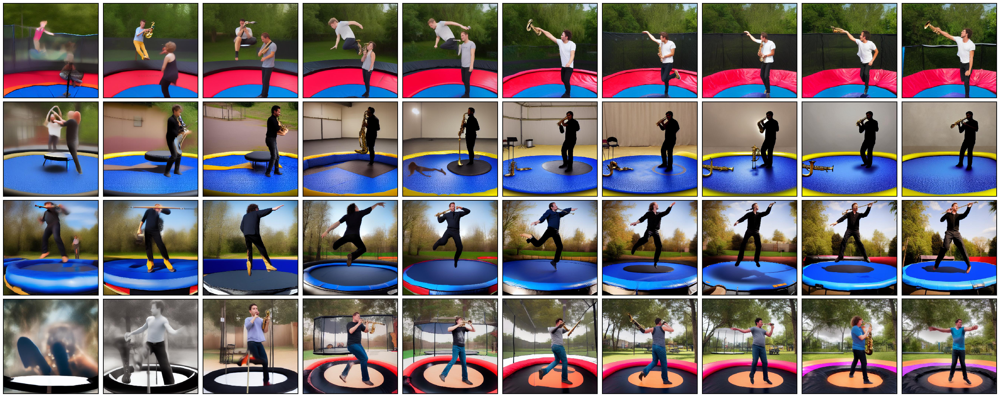

In [102]:
x = isns.ImageGrid(np.concatenate((data[0], data[1], data[2], data[3])), col_wrap=10)

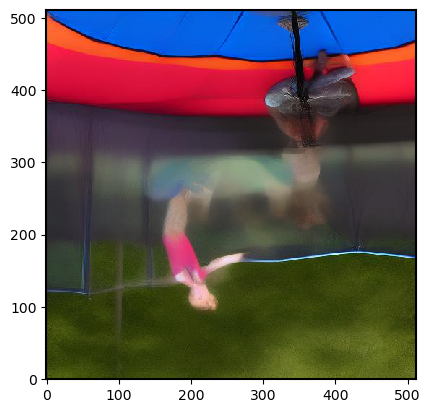

In [53]:
plt.imshow(data[0][0])

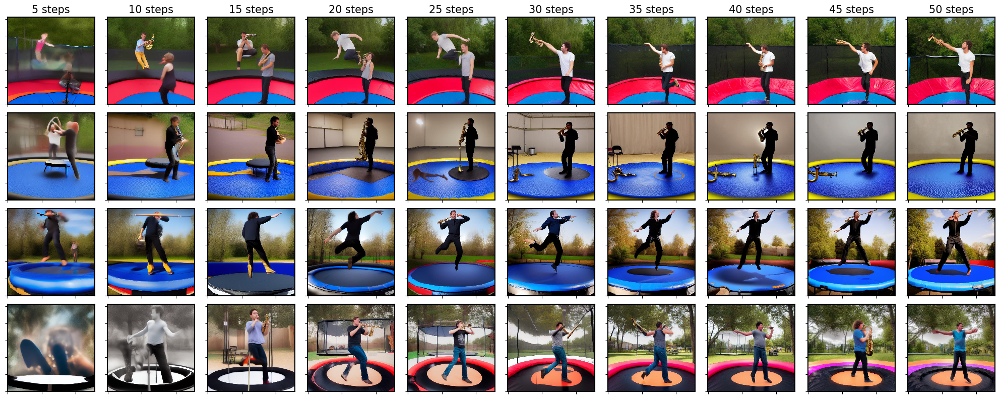

In [123]:
cols = [f'{col * 5+5} steps'.format(col) for col in range(len(scales))]
rows = ['Row {}'.format(row) for row in range(4)]

fig, axes = plt.subplots(nrows=len(rows), ncols=len(cols), figsize=(20, 8))

for ax, col in zip(axes[0], cols):
    ax.set_title(col)
# for ax, row in zip(axes[:,0], rows):
#     ax.set_ylabel(row, rotation=0, size='large')

for i in range(len(axes)):
    for j in range(len(axes[i])):
        axes[i][j].set_xticklabels([])
        axes[i][j].set_yticklabels([])
        im = np.flip(np.array(Image.open(f"ours/{scales[j]}/outputs/txt_0000{i}.jpeg")), axis=0)
        axes[i][j].imshow(im)
fig.tight_layout()
plt.savefig("our.jpeg")
plt.show()

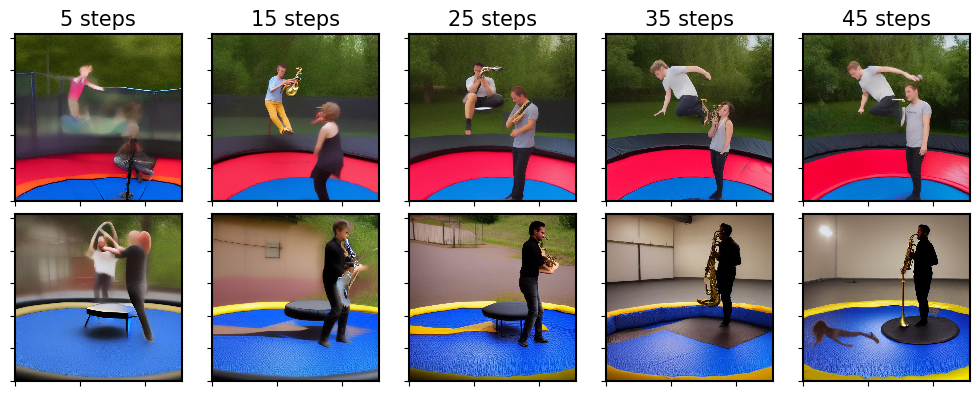

In [122]:
newscales = scales[::2]
cols = [f'{col * 10+5} steps'.format(col) for col in range(len(newscales))]
rows = ['Row {}'.format(row) for row in range(2)]

fig, axes = plt.subplots(nrows=len(rows), ncols=len(cols), figsize=(len(cols)*  2, len(rows) * 2))

for ax, col in zip(axes[0], cols):
    ax.set_title(col)
# for ax, row in zip(axes[:,0], rows):
#     ax.set_ylabel(row, rotation=0, size='large')

for i in range(len(axes)):
    for j in range(len(axes[i])):
        axes[i][j].set_xticklabels([])
        axes[i][j].set_yticklabels([])
        im = np.flip(np.array(Image.open(f"ours/{scales[j]}/outputs/txt_0000{i}.jpeg")), axis=0)
        axes[i][j].imshow(im)
fig.tight_layout()
plt.show()

In [119]:

print(scales)
print(scales[::2])

[0.7, 0.49, 0.39, 0.32, 0.27, 0.23, 0.2, 0.18, 0.16, 0.148]
[0.7, 0.39, 0.27, 0.2, 0.16]
